In [128]:
import folium
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
import fetch_data as fd
import geopandas as gpd
import matplotlib.patheffects as pe
import contextily
import sklearn as sk

from fetch_data import fetch_traffic_data
from fetch_data import get_city_info
fetch_traffic_data()
get_city_info()

Already have 2016.csv, skipping...
Already have 2017.csv, skipping...
Already have 2018.csv, skipping...
Already have 2019.csv, skipping...
Already have 2020.csv, skipping...
Already have 2021.csv, skipping...
Already have 2022.csv, skipping...
Already have 2023.csv, skipping...
Already have 2024.csv, skipping...


,regional key,city,sq km,population
0,11000000,Berlin,891.12,3685265
1,02000000,Hamburg,755.09,1862565
2,09162000,München,310.70,1505005
3,05315000,Köln,405.02,1024621
4,06412000,Frankfurt am Main,248.31,756021
...,...,...,...,...
2054,16075127,Ziegenrück,8.25,626
2055,16071061,Neumark,8.67,462
2056,16069052,Ummerstadt,15.73,455
2057,03354021,Schnackenburg,23.70,447


In [129]:
YEARS = [2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024]
df_dict = fd.get_dfs(YEARS)
df = pd.concat(df_dict.values())
city_info = fd.get_city_info()
df.describe()

,OID_,UJAHR,UMONAT,USTUNDE,UWOCHENTAG,UKATEGORIE,UART,UTYP1,ULICHTVERH,USTRZUSTAND,IstRad,IstPKW,IstFuss,IstKrad,IstGkfz,IstSonstige,LINREFX,LINREFY,XGCSWGS84,YGCSWGS84
count,2.098019e+06,2.098019e+06,2.098019e+06,2.098019e+06,2.098019e+06,2.098019e+06,2.098019e+06,2.098019e+06,2.098019e+06,2.098019e+06,2.098019e+06,2.098019e+06,2.098019e+06,2.098019e+06,1.902790e+06,2.098019e+06,2.098019e+06,2.098019e+06,2.098019e+06,2.098019e+06
mean,1.196338e+05,2.020357e+03,6.754927e+00,1.333360e+01,4.099909e+00,2.800768e+00,3.871103e+00,3.827973e+00,4.320318e-01,2.791309e-01,2.987790e-01,7.728147e-01,8.796536e-02,1.382752e-01,4.725167e-02,1.155952e-01,5.595002e+05,5.623096e+06,9.845719e+00,5.073774e+01
std,7.185906e+04,2.490690e+00,3.203685e+00,4.788369e+00,1.873301e+00,4.232954e-01,2.626432e+00,2.152959e+00,7.898641e-01,4.944200e-01,4.577228e-01,4.190134e-01,2.832446e-01,3.451887e-01,2.121767e-01,3.197390e-01,1.461430e+05,2.039809e+05,2.083310e+00,1.831311e+00
min,1.000000e+00,2.016000e+03,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.804374e+05,5.240628e+06,5.867262e+00,4.731220e+01
25%,5.827900e+04,2.018000e+03,4.000000e+00,1.000000e+01,3.000000e+00,3.000000e+00,2.000000e+00,2.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.471891e+05,5.448162e+06,8.253147e+00,4.917560e+01
50%,1.165570e+05,2.020000e+03,7.000000e+00,1.400000e+01,4.000000e+00,3.000000e+00,4.000000e+00,3.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,5.466854e+05,5.636976e+06,9.670647e+00,5.084954e+01
75%,1.777310e+05,2.023000e+03,9.000000e+00,1.700000e+01,6.000000e+00,3.000000e+00,5.000000e+00,6.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,6.796106e+05,5.792010e+06,1.147224e+01,5.226652e+01
max,2.690480e+05,2.024000e+03,1.200000e+01,2.300000e+01,7.000000e+00,3.000000e+00,9.000000e+00,7.000000e+00,2.000000e+00,2.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,9.204492e+05,6.100725e+06,1.502868e+01,5.505184e+01


In [130]:
Frankfurt = df[df["Community_key"] == "06412000"]
Frankfurt.shape
Frankfurt.groupby("UKATEGORIE").size()

UKATEGORIE
1      107
2     2760
3    19633
dtype: int64

In [131]:
Frankfurt.head()

,OID_,ULAND,UREGBEZ,UKREIS,UGEMEINDE,UJAHR,UMONAT,USTUNDE,UWOCHENTAG,UKATEGORIE,...,IstFuss,IstKrad,IstGkfz,IstSonstige,LINREFX,LINREFY,XGCSWGS84,YGCSWGS84,Community_key,UID
8575,8576,06,4,12,000,2016,1,19,7,3,...,0,0,0.0,0,471854.4512,5.545148e+06,8.606800,50.057949,06412000,2016_8576
8664,8665,06,4,12,000,2016,1,0,1,3,...,0,0,0.0,0,465949.1018,5.551119e+06,8.523772,50.111344,06412000,2016_8665
8978,8979,06,4,12,000,2016,1,15,7,1,...,0,0,0.0,0,467209.1346,5.550947e+06,8.541409,50.109870,06412000,2016_8979
9024,9025,06,4,12,000,2016,1,2,1,2,...,0,0,0.0,0,475327.1534,5.547310e+06,8.655174,50.077547,06412000,2016_9025
9074,9075,06,4,12,000,2016,1,3,6,3,...,0,0,0.0,0,477911.2036,5.548912e+06,8.691196,50.092058,06412000,2016_9075


In [132]:
accident_map = {
    1: "Driving accident",
    2: "Accident caused by turning off the road",
    3: "Accident caused by turning into a road or by crossing it",
    4: "Accident caused by crossing the road",
    5: "Accident involving stationary",
    6: "Accident between vehicles moving along in carriageway",
    7: "Other accident"
}

# 3. Apply the mapping to the 'UTYP1' column
Frankfurt.loc[:, 'UTYP1'] = Frankfurt['UTYP1'].map(accident_map)
Frankfurt.head()

C:\Users\Adria\AppData\Local\Temp\ipykernel_21900\989746763.py:12: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '['Driving accident'
 'Accident between vehicles moving along in carriageway'
 'Accident caused by turning into a road or by crossing it' ...
 'Accident between vehicles moving along in carriageway'
 'Accident caused by turning into a road or by crossing it'
 'Accident between vehicles moving along in carriageway']' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  Frankfurt.loc[:, 'UTYP1'] = Frankfurt['UTYP1'].map(accident_map)


,OID_,ULAND,UREGBEZ,UKREIS,UGEMEINDE,UJAHR,UMONAT,USTUNDE,UWOCHENTAG,UKATEGORIE,...,IstFuss,IstKrad,IstGkfz,IstSonstige,LINREFX,LINREFY,XGCSWGS84,YGCSWGS84,Community_key,UID
8575,8576,06,4,12,000,2016,1,19,7,3,...,0,0,0.0,0,471854.4512,5.545148e+06,8.606800,50.057949,06412000,2016_8576
8664,8665,06,4,12,000,2016,1,0,1,3,...,0,0,0.0,0,465949.1018,5.551119e+06,8.523772,50.111344,06412000,2016_8665
8978,8979,06,4,12,000,2016,1,15,7,1,...,0,0,0.0,0,467209.1346,5.550947e+06,8.541409,50.109870,06412000,2016_8979
9024,9025,06,4,12,000,2016,1,2,1,2,...,0,0,0.0,0,475327.1534,5.547310e+06,8.655174,50.077547,06412000,2016_9025
9074,9075,06,4,12,000,2016,1,3,6,3,...,0,0,0.0,0,477911.2036,5.548912e+06,8.691196,50.092058,06412000,2016_9075


In [133]:
Frankfurt.head()

,OID_,ULAND,UREGBEZ,UKREIS,UGEMEINDE,UJAHR,UMONAT,USTUNDE,UWOCHENTAG,UKATEGORIE,...,IstFuss,IstKrad,IstGkfz,IstSonstige,LINREFX,LINREFY,XGCSWGS84,YGCSWGS84,Community_key,UID
8575,8576,06,4,12,000,2016,1,19,7,3,...,0,0,0.0,0,471854.4512,5.545148e+06,8.606800,50.057949,06412000,2016_8576
8664,8665,06,4,12,000,2016,1,0,1,3,...,0,0,0.0,0,465949.1018,5.551119e+06,8.523772,50.111344,06412000,2016_8665
8978,8979,06,4,12,000,2016,1,15,7,1,...,0,0,0.0,0,467209.1346,5.550947e+06,8.541409,50.109870,06412000,2016_8979
9024,9025,06,4,12,000,2016,1,2,1,2,...,0,0,0.0,0,475327.1534,5.547310e+06,8.655174,50.077547,06412000,2016_9025
9074,9075,06,4,12,000,2016,1,3,6,3,...,0,0,0.0,0,477911.2036,5.548912e+06,8.691196,50.092058,06412000,2016_9075


Let us first get a rough Overview about Accidents and along which latitudes and longtitudes most of them occur.

We can clearly see the edges of Frankfurt here. The highest density of accidents unsuprisingly happens in the center of Frankfurt.

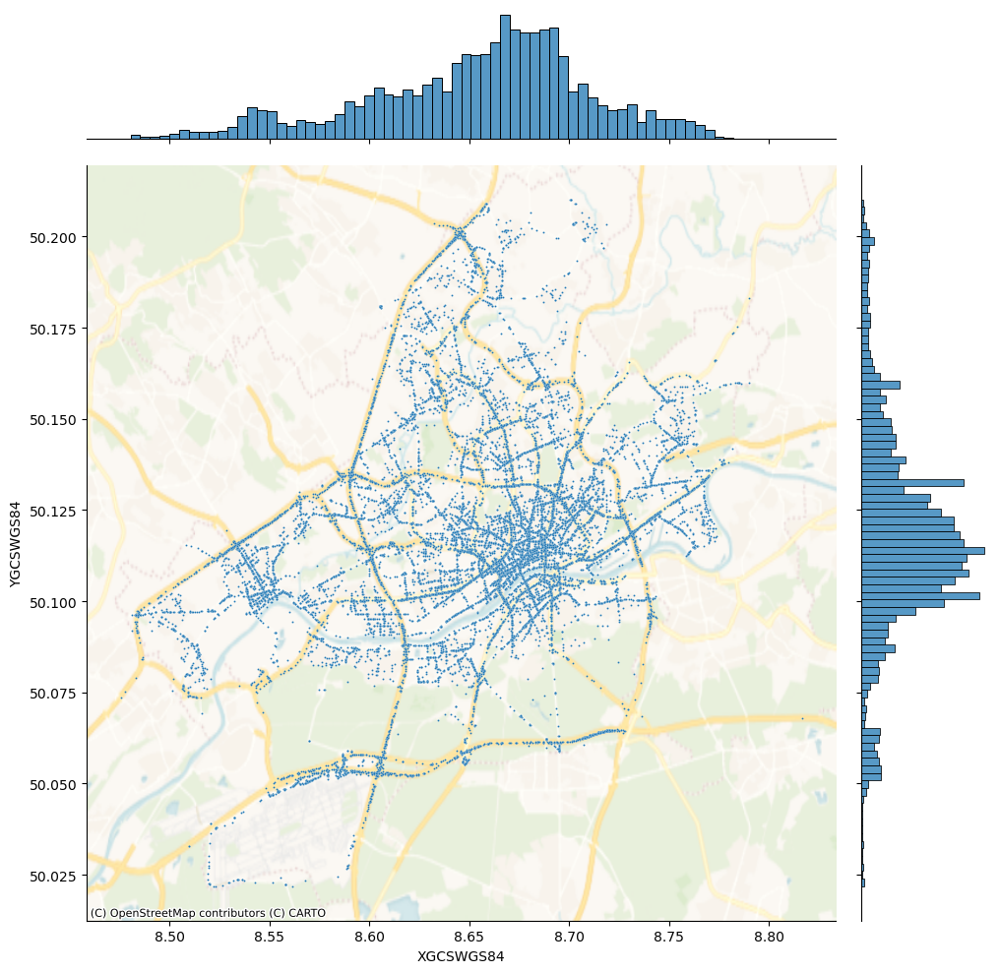

In [134]:
# Generate scatter plot
joint_axes = sns.jointplot(
    x="XGCSWGS84", y="YGCSWGS84", data=Frankfurt, s=2, height=10
)
contextily.add_basemap(
    joint_axes.ax_joint,
    crs="EPSG:4326",
    source=contextily.providers.CartoDB.VoyagerNoLabels,
);

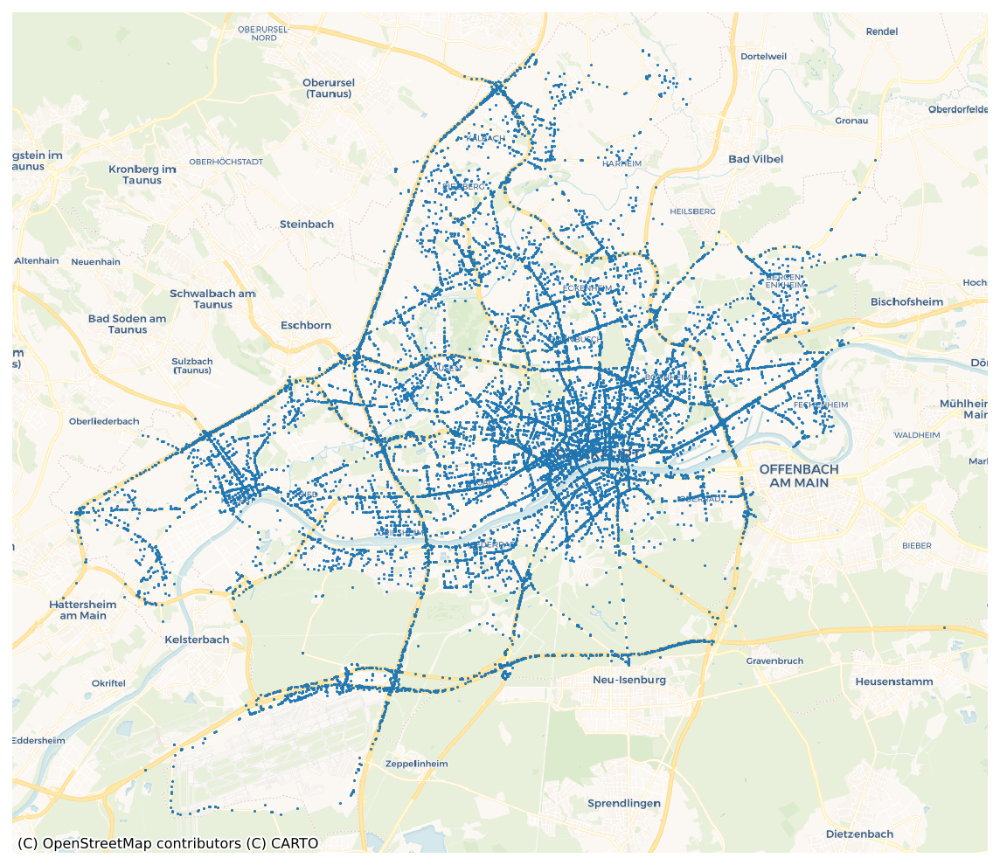

In [135]:
gdf = gpd.GeoDataFrame(
    Frankfurt,
    geometry=gpd.points_from_xy(Frankfurt.XGCSWGS84, Frankfurt.YGCSWGS84),
    crs="EPSG:4326"  # Tell it the coordinates are Lat/Lon
)
# 2. Convert (re-project) the data to Web Mercator (the map's projection)
gdf_wm = gdf.to_crs(epsg=3857)
fig, ax = plt.subplots(figsize=(10, 10), dpi=144)

gdf_wm.plot(ax=ax, markersize=0.3, alpha=1)
contextily.add_basemap(
    ax,
    #source=contextily.providers.CartoDB.PositronNoLabels
    #source=contextily.providers.OpenStreetMap.Mapnik
    source=contextily.providers.CartoDB.Voyager, zoom=12, interpolation='None'
)
ax.set_axis_off()

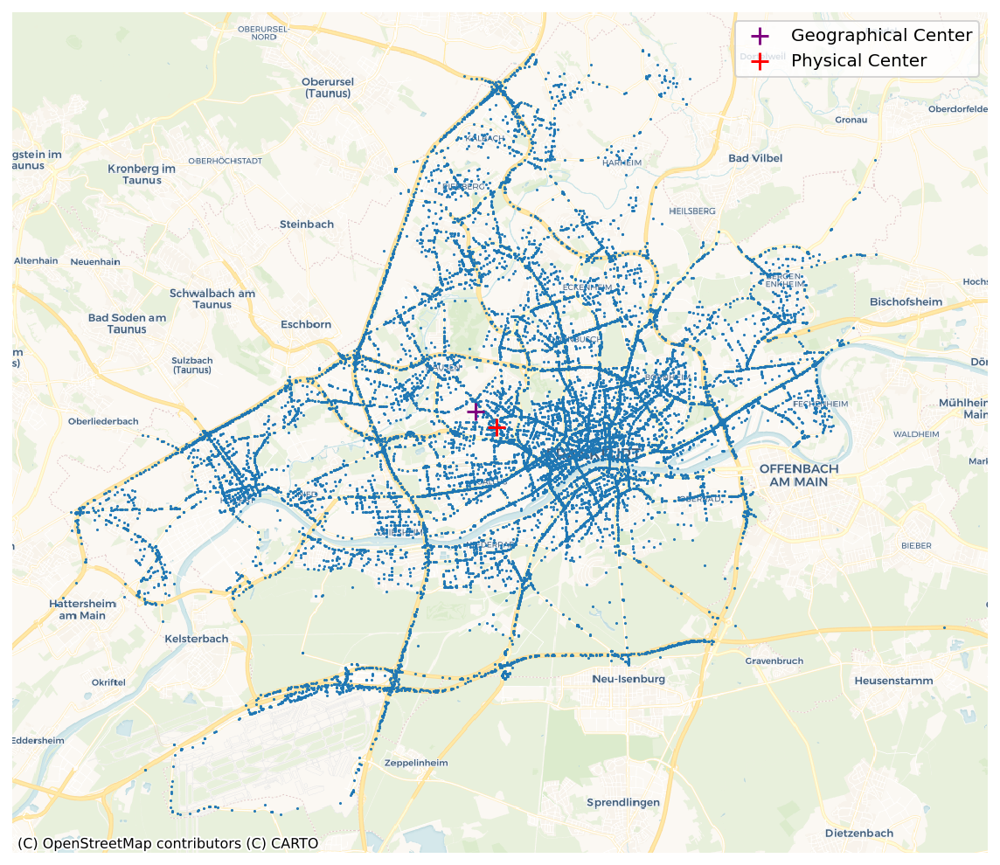

In [136]:
from shapely.geometry import Point
gdf = gpd.GeoDataFrame(
    Frankfurt,
    geometry=gpd.points_from_xy(Frankfurt.XGCSWGS84, Frankfurt.YGCSWGS84),
    crs="EPSG:4326"  # Tell it the coordinates are Lat/Lon
)

# Convert (re-project) the data to Web Mercator (the map's projection)
gdf_wm = gdf.to_crs(epsg=3857)

# Create the figure and axes
fig, ax = plt.subplots(figsize=(10, 10), dpi=144)

#Plot main data
gdf_wm.plot(ax=ax, markersize=0.3, alpha=1)


# 5. Define and plot the FIRST point (Green Cross)
point1_latlon = Point(8.636583, 50.121250)
point1_gdf = gpd.GeoDataFrame(geometry=[point1_latlon], crs="EPSG:4326")
point1_gdf_wm = point1_gdf.to_crs(epsg=3857)

point1_gdf_wm.plot(
    ax=ax,
    marker='+',
    color='Purple',
    markersize=100,
    label="Geographical Center"
)

# 6. Define and plot the SECOND point (Blue Cross)
point2_latlon = Point(8.644417, 50.117306)
point2_gdf = gpd.GeoDataFrame(geometry=[point2_latlon], crs="EPSG:4326")
point2_gdf_wm = point2_gdf.to_crs(epsg=3857)

point2_gdf_wm.plot(
    ax=ax,
    marker='+',
    color='red',
    markersize=100,
    label="Physical Center"
)

contextily.add_basemap(
    ax,
    crs=gdf_wm.crs,  # Use the CRS from our projected data
    source=contextily.providers.CartoDB.Voyager, 
    zoom=12, 
    interpolation='None'
)
ax.set_axis_off()
ax.legend()
plt.show()

Next, let us look where the geographical center 

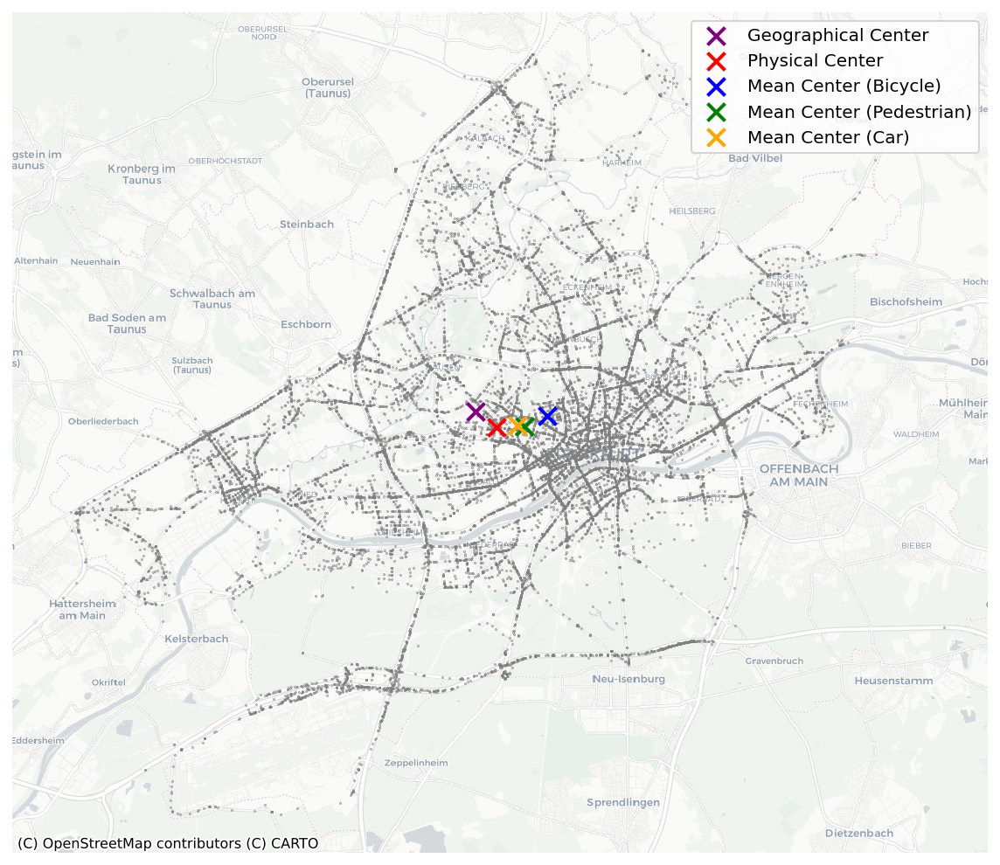

In [137]:
from shapely.geometry import Point

def plot_mean_center(ax, base_gdf, filter_col, color, label):
    """
    Calculates and plots the mean center for a filtered subset of the GeoDataFrame.
    """
    # Filter DataFrame for the specific participant and get mean
    filtered_gdf = base_gdf.loc[base_gdf[filter_col] == 1].copy()
    mean_lon = filtered_gdf['XGCSWGS84'].mean()
    mean_lat = filtered_gdf['YGCSWGS84'].mean()

    # Create a Point and GeoDataFrame
    mean_center_latlon = Point(mean_lon, mean_lat)
    mean_center_gdf = gpd.GeoDataFrame(geometry=[mean_center_latlon], crs="EPSG:4326")

    # Reproject to Mercator
    mean_center_gdf_wm = mean_center_gdf.to_crs(epsg=3857)

    # Plot the mean center
    mean_center_gdf_wm.plot(
        ax=ax,
        marker='x',
        color=color,
        markersize=100,
        linewidths=2, 
        label=label
    )


# 1. Load ALL accident data
gdf_all = gpd.GeoDataFrame(
    Frankfurt,
    geometry=gpd.points_from_xy(Frankfurt.XGCSWGS84, Frankfurt.YGCSWGS84),
    crs="EPSG:4326"  # Tell it the coordinates are Lat/Lon
)

# Reproject all data
gdf_all_wm = gdf_all.to_crs(epsg=3857)

# --- Setup the Plot ---
fig, ax = plt.subplots(figsize=(10, 10), dpi=144)

# 2. Plot ALL accidents first
gdf_all_wm.plot(ax=ax, markersize=0.1, color='gray', alpha=1)

# --- Plot Predefined Centers ---
# Geographical Center
point1_latlon = Point(8.636583, 50.121250)
point1_gdf = gpd.GeoDataFrame(geometry=[point1_latlon], crs="EPSG:4326")
point1_gdf_wm = point1_gdf.to_crs(epsg=3857)
point1_gdf_wm.plot(
    ax=ax,
    marker='x', 
    color='Purple',
    markersize=100,
    linewidths=2,  # <-- CORRECTED ARGUMENT
    label="Geographical Center"
)

# Physical Center
point2_latlon = Point(8.644417, 50.117306)
point2_gdf = gpd.GeoDataFrame(geometry=[point2_latlon], crs="EPSG:4326")
point2_gdf_wm = point2_gdf.to_crs(epsg=3857)
point2_gdf_wm.plot(
    ax=ax,
    marker='x', 
    color='red',
    markersize=100,
    linewidths=2,  # <-- CORRECTED ARGUMENT
    label="Physical Center"
)

# --- 3. Plot Mean Centers for Different Participants ---
plot_mean_center(
    ax, 
    gdf_all, 
    'IstRad', 
    'blue', 
    'Mean Center (Bicycle)'
)

plot_mean_center(
    ax, 
    gdf_all, 
    'IstFuss', 
    'green', 
    'Mean Center (Pedestrian)'
)

plot_mean_center(
    ax, 
    gdf_all, 
    'IstPKW', 
    'orange', 
    'Mean Center (Car)'
)

# --- Add Basemap and Finalize ---
contextily.add_basemap(
    ax,
    crs=gdf_all_wm.crs,
    source=contextily.providers.CartoDB.Positron,
    zoom=12,
    interpolation='None'
)

ax.set_axis_off()
ax.legend()
plt.show()

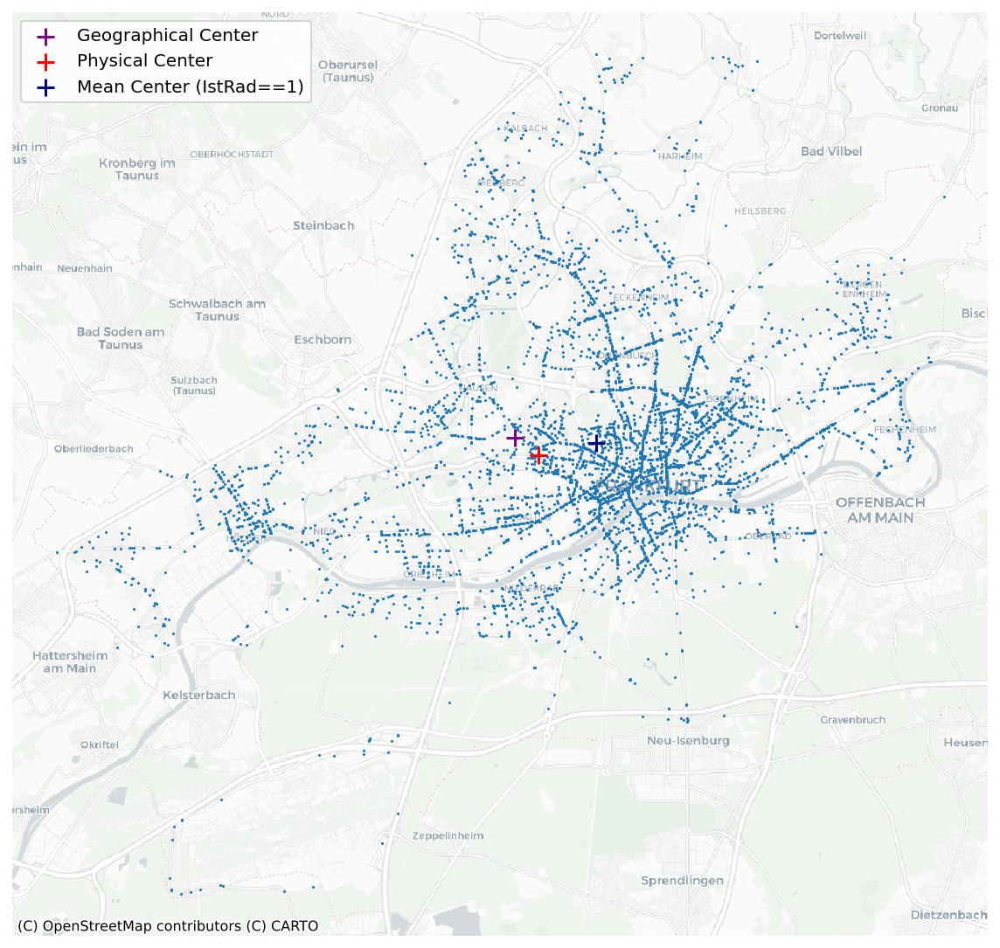

In [138]:
from shapely.geometry import Point
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily


gdf = gpd.GeoDataFrame(
    Frankfurt,
    geometry=gpd.points_from_xy(Frankfurt.XGCSWGS84, Frankfurt.YGCSWGS84),
    crs="EPSG:4326"  # Tell it the coordinates are Lat/Lon
)

# We filter gdf to only keep rows where IstRad is 1
gdf = gdf.loc[gdf['IstRad'] == 1].copy()
gdf_wm = gdf.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(10, 10), dpi=144)
gdf_wm.plot(ax=ax, markersize=0.3, alpha=1)

# Geographical Center
point1_latlon = Point(8.636583, 50.121250)
point1_gdf = gpd.GeoDataFrame(geometry=[point1_latlon], crs="EPSG:4326")
point1_gdf_wm = point1_gdf.to_crs(epsg=3857)

point1_gdf_wm.plot(
    ax=ax,
    marker='+',
    color='Purple',
    markersize=100,
    label="Geographical Center"
)

# Physical Center
point2_latlon = Point(8.644417, 50.117306)
point2_gdf = gpd.GeoDataFrame(geometry=[point2_latlon], crs="EPSG:4326")
point2_gdf_wm = point2_gdf.to_crs(epsg=3857)

point2_gdf_wm.plot(
    ax=ax,
    marker='+',
    color='red',
    markersize=100,
    label="Physical Center"
)

# Calculate the mean of the accident points geolocation
mean_lon = gdf['XGCSWGS84'].mean()
mean_lat = gdf['YGCSWGS84'].mean()

# Create a Point and GeoDataFrame in EPSG:4326
mean_center_latlon = Point(mean_lon, mean_lat)
mean_center_gdf = gpd.GeoDataFrame(geometry=[mean_center_latlon], crs="EPSG:4326")

# Reproject to Web Mercator for plotting
mean_center_gdf_wm = mean_center_gdf.to_crs(epsg=3857)

# Plot the mean center as a green cross
mean_center_gdf_wm.plot(
    ax=ax,
    marker='+',
    color='darkblue',  # As requested
    markersize=100,
    label="Mean Center (IstRad==1)"
)
# --- END OF NEW CODE BLOCK ---

contextily.add_basemap(
    ax,
    crs=gdf_wm.crs,  # Use the CRS from our projected data
    source=contextily.providers.CartoDB.Positron,
    zoom=12,
    interpolation='None'
)
ax.set_axis_off()
ax.legend()  # This will now include the "Mean Center" label
plt.show()

City Districts loaded.


C:\Users\Adria\AppData\Local\Temp\ipykernel_21900\2469306832.py:81: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


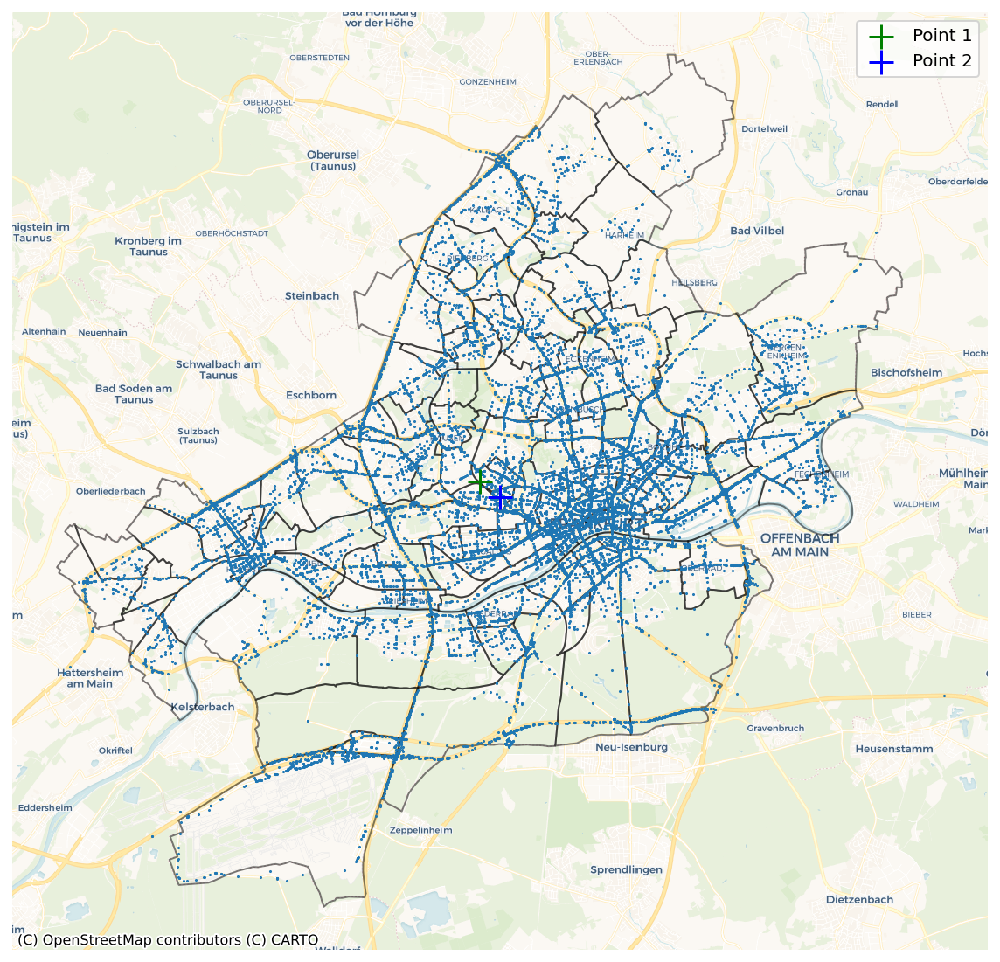

In [139]:
gdf = gpd.GeoDataFrame(
    Frankfurt,
    geometry=gpd.points_from_xy(Frankfurt.XGCSWGS84, Frankfurt.YGCSWGS84),
    crs="EPSG:4326"
)
gdf_wm = gdf.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(10, 10), dpi=144)

wfs_url = "https://geowebdienste.frankfurt.de/WFS_Stadtgebietsgliederung?request=GetFeature&service=WFS&version=1.1.0&typeName=Stadtgebietsgliederung:Stadtbezirke&outputFormat=GML3"

try:
    districts_gdf = gpd.read_file(wfs_url)
    print("City Districts loaded.")
    
    # Re-project
    districts_gdf_wm = districts_gdf.to_crs(epsg=3857)
    
    districts_gdf_wm.plot(
        ax=ax,
        facecolor='none', # No fill
        edgecolor='black',  # Black outlines
        linewidth=1.0,
        alpha=0.5,         # Semi-transparent outlines
        label="City Districts"
    )
except Exception as e:
    print(f"WARNING: Could not load City Districts from WFS. Skipping this layer. Error: {e}")

shapefile_path = "roads.zip" 

try:
    roads_gdf = gpd.read_file(shapefile_path)
    print("Road network loaded.")
    roads_gdf_wm = roads_gdf.to_crs(epsg=3857)
    
    roads_gdf_wm.plot(
        ax=ax,
        edgecolor='gray',
        linewidth=0.5,
        alpha=0.7,
        label="Road Network"
    )
except Exception as e:
    print(f"WARNING: Could not load 'roads.zip'. Make sure it's in the same folder as your script. Skipping this layer. Error: {e}")

gdf_wm.plot(ax=ax, markersize=0.3, alpha=1)

point1_latlon = Point(8.636583, 50.121250)
point1_gdf = gpd.GeoDataFrame(geometry=[point1_latlon], crs="EPSG:4326")
point1_gdf_wm = point1_gdf.to_crs(epsg=3857)

point1_gdf_wm.plot(
    ax=ax,
    marker='+',
    color='green',
    markersize=200,
    label="Point 1"
)

point2_latlon = Point(8.644417, 50.117306)
point2_gdf = gpd.GeoDataFrame(geometry=[point2_latlon], crs="EPSG:4326")
point2_gdf_wm = point2_gdf.to_crs(epsg=3857)

point2_gdf_wm.plot(
    ax=ax,
    marker='+',
    color='blue',
    markersize=200,
    label="Point 2"
)
contextily.add_basemap(
    ax,
    crs=gdf_wm.crs,
    source=contextily.providers.CartoDB.Voyager, 
    zoom=12, 
    interpolation='None'
)

ax.set_axis_off()
ax.legend()
plt.show()

Below we are trying to get a feeling for appropriate eps values for parameter selection, by creating a k-distance graph. By checking where the graph has its "elbow", we can identify approximatily which distance will give us a good clustering result. In our case this is around 150-200 meters. Since we want to find just a couple main intersections of concern, we will choose an eps value, below the elbow curve. 

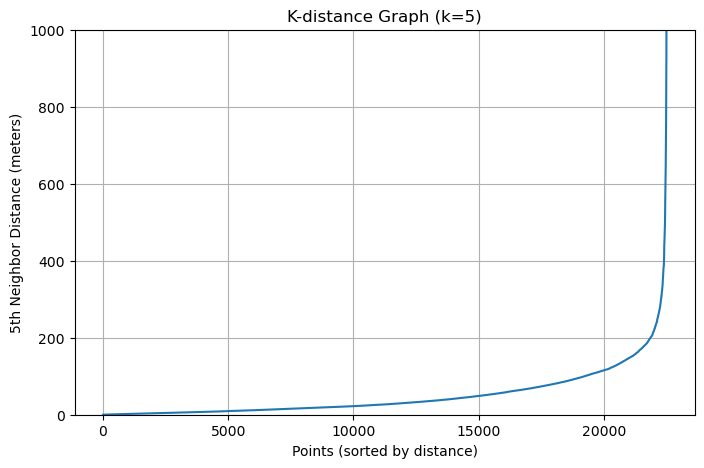

In [140]:
from sklearn.neighbors import NearestNeighbors
data_for_clustering = Frankfurt[["LINREFX", "LINREFY"]]

k = 5
neighbors = NearestNeighbors(n_neighbors=k)
neighbors_fit = neighbors.fit(data_for_clustering)
distances, indices = neighbors_fit.kneighbors(data_for_clustering)
k_distances = np.sort(distances[:, k-1], axis=0)

plt.figure(figsize=(8, 5))
plt.plot(k_distances)
plt.title('K-distance Graph (k=5)')
plt.xlabel('Points (sorted by distance)')
plt.ylabel(f'{k}th Neighbor Distance (meters)')
plt.grid(True)
plt.ylim(0, 1000)
plt.show()

Let's check where some of the main accident clusters are

--- Run Complete ---
Eps: 100, Min Samples: 85
Found 4 clusters
----------------------


C:\Users\Adria\AppData\Local\Temp\ipykernel_21900\579517511.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab20', len(cluster_ids))


--- Cluster Center Coordinates ---
         Latitude  Longitude  \
labels                         
0       50.131888   8.683750   
1       50.132667   8.695200   
2       50.109310   8.694488   
3       50.107707   8.675633   
4       50.114837   8.670445   

                                                                            Google_Maps_Link  
labels                                                                                        
0       https://www.google.com/maps/search/?api=1&query=50.131887668760044,8.683750031440045  
1        https://www.google.com/maps/search/?api=1&query=50.13266749806784,8.695199520271231  
2        https://www.google.com/maps/search/?api=1&query=50.10931003965222,8.694488326195692  
3        https://www.google.com/maps/search/?api=1&query=50.10770682661707,8.675633276106428  
4       https://www.google.com/maps/search/?api=1&query=50.114836522707364,8.670444865634185  


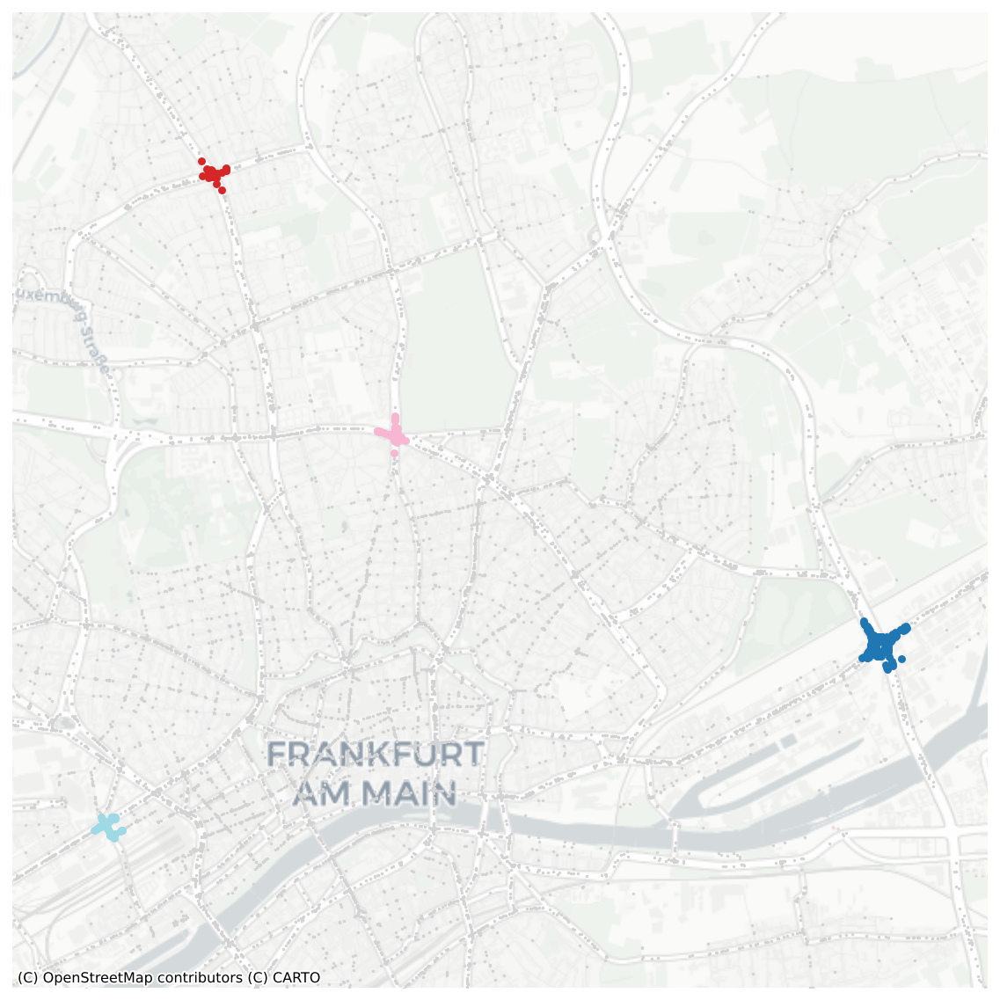

In [ ]:
from sklearn.cluster import DBSCAN

# Parameters for tuning
current_eps = 100
current_min_samples = 85

# Call and fit DBSCAN
clusterer = DBSCAN(
    metric='euclidean', 
    eps=current_eps,
    min_samples=current_min_samples
)
clusterer.fit(Frankfurt[["LINREFX", "LINREFY"]])

# Ger labels and assign
lbls = clusterer.labels_
Frankfurt.loc[:, 'labels'] = lbls

# Print findings
unique_labels = np.unique(lbls)
num_clusters = len(unique_labels[unique_labels != -1])
print(f"--- Run Complete ---")
print(f"Eps: {current_eps}, Min Samples: {current_min_samples}")
print(f"Found {num_clusters} clusters")
print("----------------------")

# Geodataframe
gdf = gpd.GeoDataFrame(
    Frankfurt,
    geometry=gpd.points_from_xy(Frankfurt.XGCSWGS84, Frankfurt.YGCSWGS84),
    crs="EPSG:4326"
)
gdf_wm = gdf.to_crs(epsg=3857)

# Plot results
fig, ax = plt.subplots(figsize=(10, 10), dpi=144)

# Plot noise
noise_wm = gdf_wm[gdf_wm['labels'] == -1]
noise_wm.plot(ax=ax, color='lightgrey', markersize=0.5, alpha=1, label='Noise')

# Get all unique cluster IDs (all non noise clusters)
cluster_ids = unique_labels[unique_labels != -1]

# Colors
colors = plt.cm.get_cmap('tab20', len(cluster_ids))

# Plot each cluster individually
for i, cluster_id in enumerate(cluster_ids):
    cluster_subset = gdf_wm[gdf_wm['labels'] == cluster_id]
    cluster_subset.plot(
        ax=ax,
        color=colors(i),
        markersize=12,
        label=f'Cluster {cluster_id}'
    )

clusters_wm = gdf_wm[gdf_wm['labels'] != -1]

# Check if any clusters were actually found
if not clusters_wm.empty:
    # Get the total bounding box of all clusters
    minx, miny, maxx, maxy = clusters_wm.total_bounds
    
    # Padding for map so it is not too close
    padding_factor = 0.1
    
    # Calculate the center of the bounding box
    center_x = (minx + maxx) / 2
    center_y = (miny + maxy) / 2
    
    # Calculate data width and height
    data_width = maxx - minx
    data_height = maxy - miny
    
    # Calculate the total range needed (data + padding on both sides)
    desired_x_range = data_width * (1 + 2 * padding_factor)
    desired_y_range = data_height * (1 + 2 * padding_factor)
    
    # Find the largest of these two ranges to make a square
    final_range = max(desired_x_range, desired_y_range)
    
    # If the range is zero (e.g., a single point), set a small default
    if final_range == 0:
        final_range = 1000  # Default 1km range (in meters for EPSG:3857)

    # Calculate the new half-range
    half_range = final_range / 2
    
    # Set the square limits centered on the data
    ax.set_xlim(center_x - half_range, center_x + half_range)
    ax.set_ylim(center_y - half_range, center_y + half_range)

# Add basemap
contextily.add_basemap(
    ax,
    source=contextily.providers.CartoDB.Positron,
    zoom='auto',
    interpolation='bilinear'
)
ax.set_axis_off()

# Filter out noise points (label == -1)
clusters_df = Frankfurt_Rad[Frankfurt_Rad['labels'] != -1]

# Check if any clusters were found
if clusters_df.empty:
    print("No clusters found (only noise).")
else:
    # Group by cluster label and get the mean of the Lat/Lon columns
    cluster_centers = clusters_df.groupby('labels')[['YGCSWGS84', 'XGCSWGS84']].mean()
    
    # Rename columns for clarity
    cluster_centers = cluster_centers.rename(columns={
        'YGCSWGS84': 'Latitude',
        'XGCSWGS84': 'Longitude'
    })
    
    # Create Google Maps link
    def create_gmaps_link(row):
        return f"https://www.google.com/maps/search/?api=1&query={row['Latitude']},{row['Longitude']}"
    
    cluster_centers['Google_Maps_Link'] = cluster_centers.apply(create_gmaps_link, axis=1)
    
    # Print the results
    pd.set_option('display.max_colwidth', None)
    print("--- Cluster Center Coordinates ---")
    print(cluster_centers)

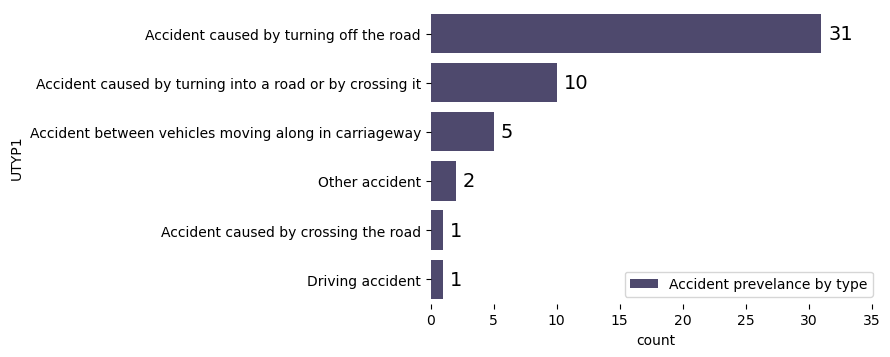

In [156]:
# Create the DataFrame with counts
plot_df = cluster_0_df['UTYP1'].value_counts().reset_index()
plot_df.columns = ['UTYP1', 'count']
plot_df['UTYP1'] = plot_df['UTYP1'].astype(str)

# --- 2. PLOTTING ---
f, ax = plt.subplots(figsize=(9, 4))
project_color = "#494373"

# Sort the new DataFrame by the count, ascending=True so the longest bar is on top
plot_df = plot_df.sort_values("count", ascending=False)

# Plotting with x="count", y="UTYP1"
sns.barplot(
    x="count", 
    y="UTYP1", 
    data=plot_df,
    orient='h',  # <-- Forcing horizontal orientation
    label="Accident prevelance by type", 
    color=project_color
)

# This adds the value label (e.g., '25') to the end of each bar
ax.bar_label(
    ax.containers[0], 
    fmt='%.0f',
    padding=5,
    fontsize=14,
    color='black'
)

# Get the max value from the 'count' column for the x-limit
max_val = plot_df['count'].max()
ax.set(xlim=(0, max_val * 1.15))

# Move the legend
ax.legend(
    loc="lower right", 
    frameon=True
)

# Style and show
sns.despine(left=True, bottom=True)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.grid(False)
sns.despine(left=True, bottom=True)
plt.show()

In [142]:
print("\n--- Breakdown of Accident Category (UTYP1) by Cluster ---")
print(clusters_df.groupby('labels')['UTYP1'].value_counts())


--- Breakdown of Accident Category (UTYP1) by Cluster ---
labels  UTYP1
0       2        31
        3        10
        6         5
        7         2
        1         1
        4         1
1       2        30
        3        15
        6         8
        4         3
        1         2
        5         1
2       2        19
        3        11
        6         6
        7         4
        5         3
        4         2
        1         1
3       2        22
        3         9
        6         7
        7         4
        1         2
        5         2
        4         1
4       2        16
        3        12
        6         5
        7         4
        5         3
        4         1
Name: count, dtype: int64


Next, let us look at Accident events, in which Bicyclists are involved

--- Run Complete for 'IstRad == 1' ---
Eps: 100, Min Samples: 40
Found 5 clusters
----------------------


C:\Users\Adria\AppData\Local\Temp\ipykernel_21900\1748106013.py:51: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab20', len(cluster_ids))


--- Cluster Center Coordinates ---
         Latitude  Longitude  \
labels                         
0       50.131888   8.683750   
1       50.132667   8.695200   
2       50.109310   8.694488   
3       50.107707   8.675633   
4       50.114837   8.670445   

                                                                            Google_Maps_Link  
labels                                                                                        
0       https://www.google.com/maps/search/?api=1&query=50.131887668760044,8.683750031440045  
1        https://www.google.com/maps/search/?api=1&query=50.13266749806784,8.695199520271231  
2        https://www.google.com/maps/search/?api=1&query=50.10931003965222,8.694488326195692  
3        https://www.google.com/maps/search/?api=1&query=50.10770682661707,8.675633276106428  
4       https://www.google.com/maps/search/?api=1&query=50.114836522707364,8.670444865634185  


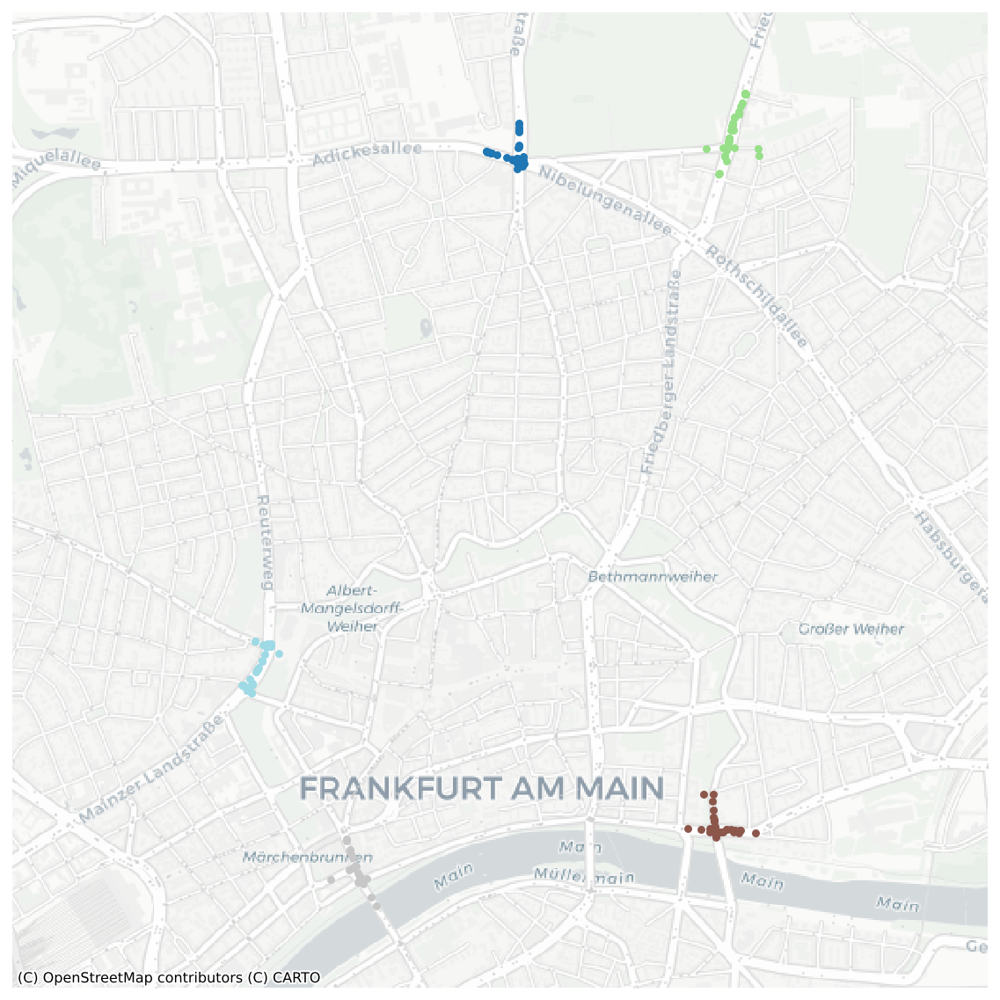

In [162]:
from sklearn.cluster import DBSCAN

Frankfurt_Rad = Frankfurt[Frankfurt['IstRad'] == 1].copy()

# Parameters for tuning
current_eps = 100
current_min_samples = 40

# Call and fit DBSCAN
clusterer = DBSCAN(
    metric='euclidean', 
    eps=current_eps,
    min_samples=current_min_samples
)
# --- MODIFIED: Use the Rad ---
clusterer.fit(Frankfurt_Rad[["LINREFX", "LINREFY"]])

# Ger labels and assign
lbls = clusterer.labels_
# --- MODIFIED: Use the Rad ---
Frankfurt_Rad.loc[:, 'labels'] = lbls

# Print findings
unique_labels = np.unique(lbls)
num_clusters = len(unique_labels[unique_labels != -1])
print(f"--- Run Complete for 'IstRad == 1' ---") # Added detail
print(f"Eps: {current_eps}, Min Samples: {current_min_samples}")
print(f"Found {num_clusters} clusters")
print("----------------------")

# Geodataframe
# --- MODIFIED: Use the Rad ---
gdf = gpd.GeoDataFrame(
    Frankfurt_Rad, 
    geometry=gpd.points_from_xy(Frankfurt_Rad.XGCSWGS84, Frankfurt_Rad.YGCSWGS84),
    crs="EPSG:4326"
)
gdf_wm = gdf.to_crs(epsg=3857)

# Plot results
fig, ax = plt.subplots(figsize=(10, 10), dpi=144)

# Plot noise
noise_wm = gdf_wm[gdf_wm['labels'] == -1]
noise_wm.plot(ax=ax, color='lightgrey', markersize=0.5, alpha=0.5, label='Noise')

# Get all unique cluster IDs (all non noise clusters)
cluster_ids = unique_labels[unique_labels != -1]

# Colors
colors = plt.cm.get_cmap('tab20', len(cluster_ids))

# Plot each cluster individually
for i, cluster_id in enumerate(cluster_ids):
    cluster_Rad = gdf_wm[gdf_wm['labels'] == cluster_id]
    cluster_Rad.plot(
        ax=ax,
        color=colors(i),
        markersize=12,
        label=f'Cluster {cluster_id}'
    )

clusters_wm = gdf_wm[gdf_wm['labels'] != -1]

# Check if any clusters were actually found
if not clusters_wm.empty:
    # Get the total bounding box of all clusters
    minx, miny, maxx, maxy = clusters_wm.total_bounds
    
    # --- ADJUST YOUR PADDING HERE ---
    # This factor is added to each side (e.g., 0.1 = 10% padding)
    padding_factor = 0.1
    
    # Calculate the center of the bounding box
    center_x = (minx + maxx) / 2
    center_y = (miny + maxy) / 2
    
    # Calculate data width and height
    data_width = maxx - minx
    data_height = maxy - miny
    
    # Calculate the total range needed (data + padding on both sides)
    desired_x_range = data_width * (1 + 2 * padding_factor)
    desired_y_range = data_height * (1 + 2 * padding_factor)
    
    # Find the largest of these two ranges to make a square
    final_range = max(desired_x_range, desired_y_range)
    
    # If the range is zero (e.g., a single point), set a small default
    if final_range == 0:
        final_range = 1000  # Default 1km range (in meters for EPSG:3857)

    # Calculate the new half-range
    half_range = final_range / 2
    
    # Set the square limits centered on the data
    ax.set_xlim(center_x - half_range, center_x + half_range)
    ax.set_ylim(center_y - half_range, center_y + half_range)
    
# Add basemap
contextily.add_basemap(
    ax,
    source=contextily.providers.CartoDB.Positron,
    zoom='auto',
    interpolation='None'
)
ax.set_axis_off()

# Filter out noise points (label == -1)
clusters_df = Frankfurt_Rad[Frankfurt_Rad['labels'] != -1]

# Check if any clusters were found
if clusters_df.empty:
    print("No clusters found (only noise).")
else:
    # Group by cluster label and get the mean of the Lat/Lon columns
    cluster_centers = clusters_df.groupby('labels')[['YGCSWGS84', 'XGCSWGS84']].mean()
    
    # Rename columns for clarity
    cluster_centers = cluster_centers.rename(columns={
        'YGCSWGS84': 'Latitude',
        'XGCSWGS84': 'Longitude'
    })
    
    # Create Google Maps link
    def create_gmaps_link(row):
        return f"https://www.google.com/maps/search/?api=1&query={row['Latitude']},{row['Longitude']}"
    
    cluster_centers['Google_Maps_Link'] = cluster_centers.apply(create_gmaps_link, axis=1)
    
    # Print the results
    pd.set_option('display.max_colwidth', None)
    print("--- Cluster Center Coordinates ---")
    print(cluster_centers)

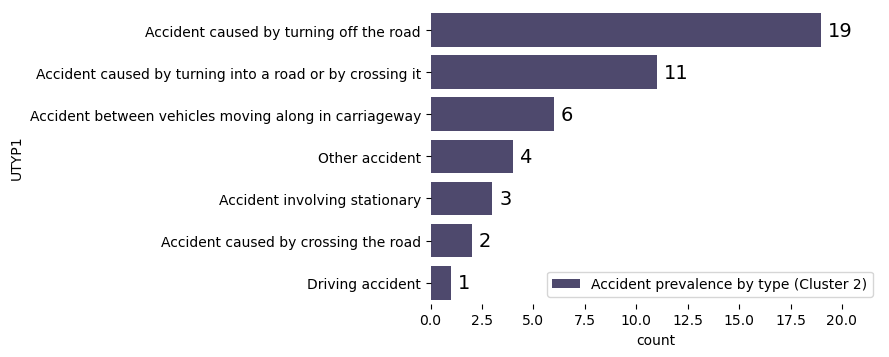

In [166]:
# --- Create a DataFrame just for Cluster 2 ---
# (You would do this after the clustering code and before the plotting code)
cluster_2_df = Frankfurt_Rad[Frankfurt_Rad['labels'] == 2]

# You can add a check to make sure the cluster exists and is not empty
if cluster_2_df.empty:
    print("Cluster 2 was not found or has no members.")
else:
    # --- 1. Create the DataFrame with counts from cluster_2_df ---
    plot_df = cluster_2_df['UTYP1'].value_counts().reset_index()
    plot_df.columns = ['UTYP1', 'count']
    plot_df['UTYP1'] = plot_df['UTYP1'].astype(str)

    # --- 2. PLOTTING ---
    f, ax = plt.subplots(figsize=(9, 4))
    project_color = "#494373" # You can change this color if you like

    # Sort the new DataFrame by the count
    plot_df = plot_df.sort_values("count", ascending=False)

    # Plotting with x="count", y="UTYP1"
    sns.barplot(
        x="count", 
        y="UTYP1", 
        data=plot_df,
        orient='h',
        label="Accident prevalence by type (Cluster 2)", # <-- Updated label
        color=project_color
    )

    # This adds the value label (e.g., '25') to the end of each bar
    ax.bar_label(
        ax.containers[0], 
        fmt='%.0f',
        padding=5,
        fontsize=14,
        color='black'
    )

    # Get the max value from the 'count' column for the x-limit
    max_val = plot_df['count'].max()
    ax.set(xlim=(0, max_val * 1.15))
    
    # Set a title for clarity
    #ax.set_title("Accident Types for Cluster 2", fontsize=16)

    # Move the legend
    ax.legend(
        loc="lower right", 
        frameon=True
    )

    # Style and show
    sns.despine(left=True, bottom=True)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.grid(False)
    
    # --- IMPORTANT ---
    # To save the plot in a notebook or script, replace plt.show() with plt.savefig()
    plt.savefig("cluster_2_barplot.png", dpi=144, bbox_inches='tight')
    # plt.show()

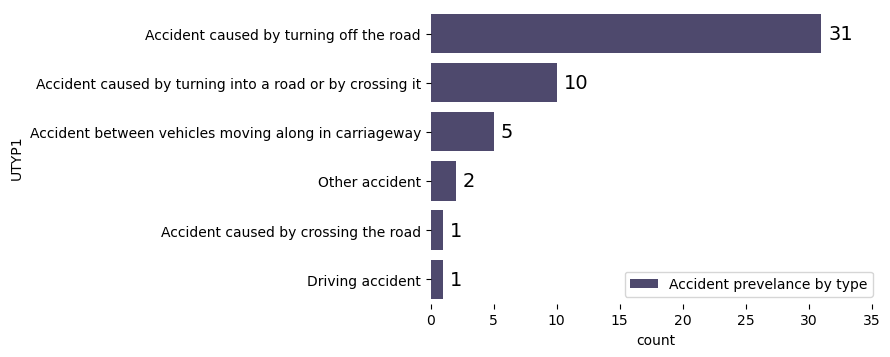

In [164]:
# Create the DataFrame with counts
plot_df = cluster_0_df['UTYP1'].value_counts().reset_index()
plot_df.columns = ['UTYP1', 'count']
plot_df['UTYP1'] = plot_df['UTYP1'].astype(str)

# --- 2. PLOTTING ---
f, ax = plt.subplots(figsize=(9, 4))
project_color = "#494373"

# Sort the new DataFrame by the count, ascending=True so the longest bar is on top
plot_df = plot_df.sort_values("count", ascending=False)

# Plotting with x="count", y="UTYP1"
sns.barplot(
    x="count", 
    y="UTYP1", 
    data=plot_df,
    orient='h',  # <-- Forcing horizontal orientation
    label="Accident prevelance by type", 
    color=project_color
)

# This adds the value label (e.g., '25') to the end of each bar
ax.bar_label(
    ax.containers[0], 
    fmt='%.0f',
    padding=5,
    fontsize=14,
    color='black'
)

# Get the max value from the 'count' column for the x-limit
max_val = plot_df['count'].max()
ax.set(xlim=(0, max_val * 1.15))

# Move the legend
ax.legend(
    loc="lower right", 
    frameon=True
)

# Style and show
sns.despine(left=True, bottom=True)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.grid(False)
plt.show()

In [144]:
# We already have clusters_df from your report code
# clusters_df = Frankfurt_Rad[Frankfurt_Rad['labels'] != -1]

if not clusters_df.empty:
    
    # --- Add this code ---
    
    print("\n--- Breakdown of Accident Type (UART) by Cluster ---")
    # This groups by cluster, then counts the occurrences of each 'UART' value
    print(clusters_df.groupby('labels')['UART'].value_counts())

    print("\n--- Breakdown of Accident Category (UTYP1) by Cluster ---")
    print(clusters_df.groupby('labels')['UTYP1'].value_counts())
    
    print("\n--- Breakdown of Lighting (ULICHTVERH) by Cluster ---")
    print(clusters_df.groupby('labels')['ULICHTVERH'].value_counts())
    
    # --- End of added code ---

else:
    print("No clusters found to inspect.")


--- Breakdown of Accident Type (UART) by Cluster ---
labels  UART
0       3       24
        5       18
        0        5
        2        2
        6        1
1       3       24
        5       21
        0        6
        6        3
        2        2
        4        2
        1        1
2       5       21
        3        5
        0        4
        4        4
        1        3
        6        3
        7        3
        2        2
        8        1
3       5       14
        3       13
        0        7
        2        4
        6        4
        1        3
        4        2
4       5       22
        0        6
        3        6
        4        4
        6        2
        1        1
Name: count, dtype: int64

--- Breakdown of Accident Category (UTYP1) by Cluster ---
labels  UTYP1                                                   
0       Accident caused by turning off the road                     31
        Accident caused by turning into a road or by crossing it  

In [145]:
# Show all original data for accidents in Cluster 0
cluster_0_df = Frankfurt_Rad[Frankfurt_Rad['labels'] == 0]
cluster_0_df

,OID_,ULAND,UREGBEZ,UKREIS,UGEMEINDE,UJAHR,UMONAT,USTUNDE,UWOCHENTAG,UKATEGORIE,...,IstKrad,IstGkfz,IstSonstige,LINREFX,LINREFY,XGCSWGS84,YGCSWGS84,Community_key,UID,labels
11630,11631,06,4,12,000,2016,3,8,6,3,...,0,0.0,1,477414.859100,5.553372e+06,8.683993,50.132156,06412000,2016_11631,0
13636,13637,06,4,12,000,2016,4,12,6,3,...,0,0.0,0,477400.554100,5.553321e+06,8.683796,50.131693,06412000,2016_13637,0
15875,15876,06,4,12,000,2016,7,7,4,3,...,0,0.0,0,477428.382000,5.553314e+06,8.684186,50.131634,06412000,2016_15876,0
16385,16386,06,4,12,000,2016,7,19,6,3,...,0,0.0,0,477416.775600,5.553438e+06,8.684016,50.132747,06412000,2016_16386,0
16402,16403,06,4,12,000,2016,7,9,2,3,...,0,0.0,0,477410.786500,5.553327e+06,8.683939,50.131747,06412000,2016_16403,0
16700,16701,06,4,12,000,2016,7,20,3,3,...,0,0.0,0,477414.463600,5.553368e+06,8.683988,50.132116,06412000,2016_16701,0
105726,105727,06,4,12,000,2016,7,10,6,2,...,0,0.0,0,477333.870000,5.553342e+06,8.682862,50.131884,06412000,2016_105727,0
105829,105830,06,4,12,000,2016,6,10,4,2,...,0,0.0,0,477390.743400,5.553324e+06,8.683658,50.131722,06412000,2016_105830,0
27033,27034,06,4,12,000,2017,1,15,5,3,...,0,NaN,0,477409.970000,5.553318e+06,8.683928,50.131666,06412000,2017_27034,0
33730,33731,06,4,12,000,2017,7,8,3,3,...,0,NaN,0,477416.724100,5.553443e+06,8.684015,50.132795,06412000,2017_33731,0


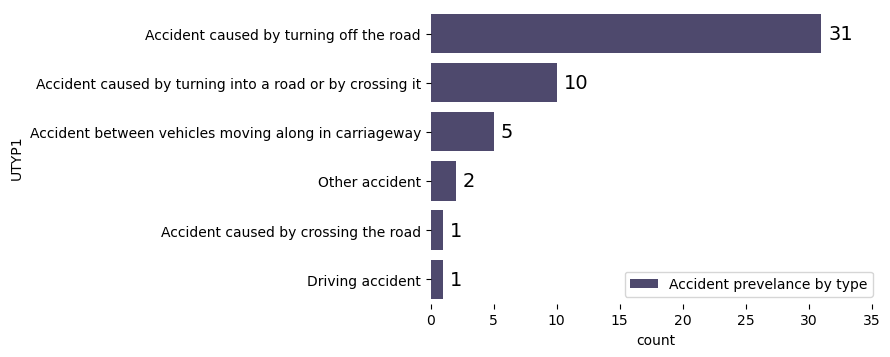

In [146]:
# Create the DataFrame with counts
plot_df = cluster_0_df['UTYP1'].value_counts().reset_index()
plot_df.columns = ['UTYP1', 'count']
plot_df['UTYP1'] = plot_df['UTYP1'].astype(str)

# --- 2. PLOTTING ---
f, ax = plt.subplots(figsize=(9, 4))
project_color = "#494373"

# Sort the new DataFrame by the count, ascending=True so the longest bar is on top
plot_df = plot_df.sort_values("count", ascending=False)

# Plotting with x="count", y="UTYP1"
sns.barplot(
    x="count", 
    y="UTYP1", 
    data=plot_df,
    orient='h',  # <-- Forcing horizontal orientation
    label="Accident prevelance by type", 
    color=project_color
)

# This adds the value label (e.g., '25') to the end of each bar
ax.bar_label(
    ax.containers[0], 
    fmt='%.0f',
    padding=5,
    fontsize=14,
    color='black'
)

# Get the max value from the 'count' column for the x-limit
max_val = plot_df['count'].max()
ax.set(xlim=(0, max_val * 1.15))

# Move the legend
ax.legend(
    loc="lower right", 
    frameon=True
)

# Style and show
sns.despine(left=True, bottom=True)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.grid(False)
plt.show()

Next, let's check for accident clusters including Pedestrians

--- Run Complete for 'IstFuss == 1' ---
Eps: 100, Min Samples: 20
Found 5 clusters
----------------------


C:\Users\Adria\AppData\Local\Temp\ipykernel_21900\2828403303.py:51: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab20', len(cluster_ids))


--- Cluster Center Coordinates ---
         Latitude  Longitude  \
labels                         
0       50.107623   8.665251   
1       50.127003   8.692066   
2       50.114260   8.687714   
3       50.109289   8.665735   
4       50.123177   8.701829   

                                                                            Google_Maps_Link  
labels                                                                                        
0        https://www.google.com/maps/search/?api=1&query=50.10762310240005,8.665250677780044  
1         https://www.google.com/maps/search/?api=1&query=50.12700253795459,8.69206562454549  
2       https://www.google.com/maps/search/?api=1&query=50.114259839911156,8.687714124533379  
3        https://www.google.com/maps/search/?api=1&query=50.10928948112505,8.665734736750046  
4        https://www.google.com/maps/search/?api=1&query=50.123177139500044,8.70182862185003  


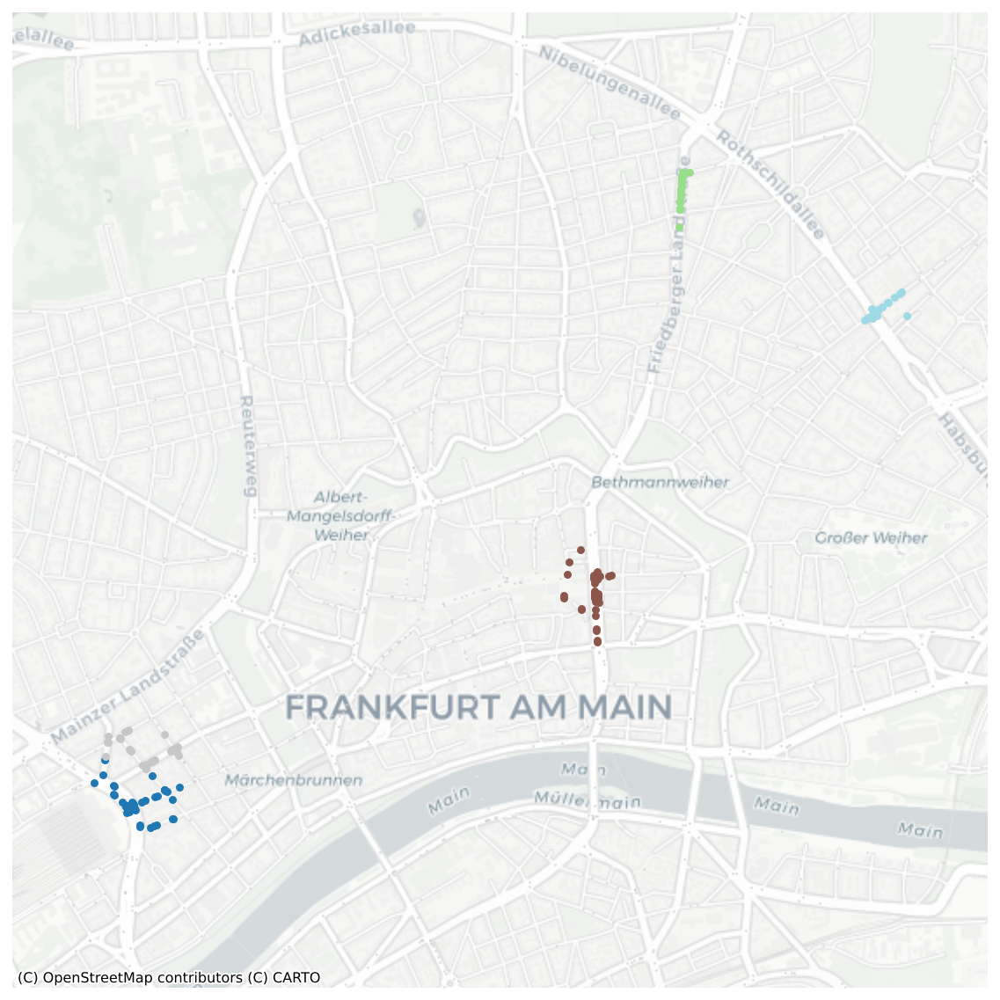

In [180]:
from sklearn.cluster import DBSCAN

Frankfurt_Pedestrian = Frankfurt[Frankfurt['IstFuss'] == 1].copy()

# Parameters for tuning
current_eps = 100
current_min_samples = 20

# Call and fit DBSCAN
clusterer = DBSCAN(
    metric='euclidean', 
    eps=current_eps,
    min_samples=current_min_samples
)
# --- MODIFIED: Use the Rad ---
clusterer.fit(Frankfurt_Pedestrian[["LINREFX", "LINREFY"]])

# Ger labels and assign
lbls = clusterer.labels_
# --- MODIFIED: Use the Rad ---
Frankfurt_Pedestrian.loc[:, 'labels'] = lbls

# Print findings
unique_labels = np.unique(lbls)
num_clusters = len(unique_labels[unique_labels != -1])
print(f"--- Run Complete for 'IstFuss == 1' ---") # Added detail
print(f"Eps: {current_eps}, Min Samples: {current_min_samples}")
print(f"Found {num_clusters} clusters")
print("----------------------")

# Geodataframe
# --- MODIFIED: Use the Rad ---
gdf = gpd.GeoDataFrame(
    Frankfurt_Pedestrian, 
    geometry=gpd.points_from_xy(Frankfurt_Pedestrian.XGCSWGS84, Frankfurt_Pedestrian.YGCSWGS84),
    crs="EPSG:4326"
)
gdf_wm = gdf.to_crs(epsg=3857)

# Plot results
fig, ax = plt.subplots(figsize=(10, 10), dpi=144)

# Plot noise
noise_wm = gdf_wm[gdf_wm['labels'] == -1]
noise_wm.plot(ax=ax, color='lightgrey', markersize=0.5, alpha=0.5, label='Noise')

# Get all unique cluster IDs (all non noise clusters)
cluster_ids = unique_labels[unique_labels != -1]

# Colors
colors = plt.cm.get_cmap('tab20', len(cluster_ids))

# Plot each cluster individually
for i, cluster_id in enumerate(cluster_ids):
    cluster_Rad = gdf_wm[gdf_wm['labels'] == cluster_id]
    cluster_Rad.plot(
        ax=ax,
        color=colors(i),
        markersize=12,
        label=f'Cluster {cluster_id}'
    )

clusters_wm = gdf_wm[gdf_wm['labels'] != -1]

# Check if any clusters were actually found
if not clusters_wm.empty:
    # Get the total bounding box of all clusters
    minx, miny, maxx, maxy = clusters_wm.total_bounds
    
    # --- ADJUST YOUR PADDING HERE ---
    # This factor is added to each side (e.g., 0.1 = 10% padding)
    padding_factor = 0.1
    
    # Calculate the center of the bounding box
    center_x = (minx + maxx) / 2
    center_y = (miny + maxy) / 2
    
    # Calculate data width and height
    data_width = maxx - minx
    data_height = maxy - miny
    
    # Calculate the total range needed (data + padding on both sides)
    desired_x_range = data_width * (1 + 2 * padding_factor)
    desired_y_range = data_height * (1 + 2 * padding_factor)
    
    # Find the largest of these two ranges to make a square
    final_range = max(desired_x_range, desired_y_range)
    
    # If the range is zero (e.g., a single point), set a small default
    if final_range == 0:
        final_range = 1000  # Default 1km range (in meters for EPSG:3857)

    # Calculate the new half-range
    half_range = final_range / 2
    
    # Set the square limits centered on the data
    ax.set_xlim(center_x - half_range, center_x + half_range)
    ax.set_ylim(center_y - half_range, center_y + half_range)

# Add basemap
contextily.add_basemap(
    ax,
    source=contextily.providers.CartoDB.Positron,
    zoom='auto',
    interpolation='bilinear'
)
ax.set_axis_off()

# Filter out noise points (label == -1)
clusters_df = Frankfurt_Pedestrian[Frankfurt_Pedestrian['labels'] != -1]

# Check if any clusters were found
if clusters_df.empty:
    print("No clusters found (only noise).")
else:
    # Group by cluster label and get the mean of the Lat/Lon columns
    cluster_centers = clusters_df.groupby('labels')[['YGCSWGS84', 'XGCSWGS84']].mean()
    
    # Rename columns for clarity
    cluster_centers = cluster_centers.rename(columns={
        'YGCSWGS84': 'Latitude',
        'XGCSWGS84': 'Longitude'
    })
    
    # Create Google Maps link
    def create_gmaps_link(row):
        return f"https://www.google.com/maps/search/?api=1&query={row['Latitude']},{row['Longitude']}"
    
    cluster_centers['Google_Maps_Link'] = cluster_centers.apply(create_gmaps_link, axis=1)
    
    # Print the results
    pd.set_option('display.max_colwidth', None)
    print("--- Cluster Center Coordinates ---")
    print(cluster_centers)

    # We already have clusters_df from your report code
clusters_df = Frankfurt_Rad[Frankfurt_Rad['labels'] != -1]

In [181]:
# --- 1. Get the specific dataframe for Cluster 1 ---
# This assumes the 'cluster_dataframes' dictionary exists
cluster_1_df = cluster_dataframes[1]

# --- 2. Create the DataFrame with counts from Cluster 1 ---
plot_df = cluster_1_df['UTYP1'].value_counts().reset_index()
plot_df.columns = ['UTYP1', 'count']
plot_df['UTYP1'] = plot_df['UTYP1'].astype(str)

# --- 3. PLOTTING (your code is perfect) ---
f, ax = plt.subplots(figsize=(9, 4))
project_color = "#494373"

# Sort the new DataFrame by the count
plot_df = plot_df.sort_values("count", ascending=False)

# Plotting with x="count", y="UTYP1"
sns.barplot(
    x="count", 
    y="UTYP1", 
    data=plot_df,
    orient='h',
    label="Accident prevalence by type (Cluster 1)",  # <-- I updated the label
    color=project_color
)

# This adds the value label (e.g., '25') to the end of each bar
ax.bar_label(
    ax.containers[0], 
    fmt='%.0f',
    padding=5,
    fontsize=14,
    color='black'
)

# Get the max value from the 'count' column for the x-limit
max_val = plot_df['count'].max()
ax.set(xlim=(0, max_val * 1.15))

# Move the legend
ax.legend(
    loc="lower right", 
    frameon=True
)

# Style and show
sns.despine(left=True, bottom=True)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.grid(False)
plt.show()

NameError: name 'cluster_dataframes' is not defined

In [184]:
# DBSCAN parameters
CURRENT_EPS = 100
CURRENT_MIN_SAMPLES = 20

# Analysis parameters
COORDINATE_SYSTEM_GPS = "EPSG:4326"
COORDINATE_SYSTEM_WEB = "EPSG:3857"

# Plotting parameters
CLUSTER_TO_PLOT = 1
MAP_PADDING_FACTOR = 0.1
CHART_COLOR = "#494373"

# This placeholder is necessary for the script to run.
if 'Frankfurt' not in locals():
    print("Error: 'Frankfurt' dataframe not loaded. Please load your data first.")
    # YOU MUST REPLACE THIS:
    Frankfurt = pd.DataFrame() 

# 3. RUN CLUSTERING & CREATE REPORTS 
print(f"Running DBSCAN (Eps={CURRENT_EPS}, MinSamples={CURRENT_MIN_SAMPLES}) ")

# Filter for pedestrians
Frankfurt_Pedestrian = Frankfurt[Frankfurt['IstFuss'] == 1].copy()

if Frankfurt_Pedestrian.empty:
    print("No 'IstFuss == 1' data found. Stopping script.")
else:
    # Run DBSCAN
    clusterer = DBSCAN(
        metric='euclidean', 
        eps=CURRENT_EPS,
        min_samples=CURRENT_MIN_SAMPLES
    )
    clusterer.fit(Frankfurt_Pedestrian[["LINREFX", "LINREFY"]])
    Frankfurt_Pedestrian.loc[:, 'labels'] = clusterer.labels_

    # Cluster Report 
    unique_labels = np.unique(clusterer.labels_)
    num_clusters = len(unique_labels[unique_labels != -1])
    print(f"Found {num_clusters} clusters.")

    # Filter out noise points for all cluster-based analysis
    clusters_df = Frankfurt_Pedestrian[Frankfurt_Pedestrian['labels'] != -1]

    if clusters_df.empty:
        print("No clusters found (only noise). Map and charts will not be generated.")
    else:
        # Coordinates Report 
        print("Cluster Center Coordinates ")
        cluster_centers = clusters_df.groupby('labels')[['YGCSWGS84', 'XGCSWGS84']].mean()
        cluster_centers.rename(columns={'YGCSWGS84': 'Latitude', 'XGCSWGS84': 'Longitude'}, inplace=True)
        cluster_centers['Google_Maps_Link'] = cluster_centers.apply(
            lambda row: f"https://www.google.com/maps/search/?api=1&query={row['Latitude']},{row['Longitude']}", 
            axis=1
        )
        pd.set_option('display.max_colwidth', None)
        print(cluster_centers)

        
        # 4. PLOT CLUSTER MAP 
        
        print("Generating Cluster Map ")
        gdf = gpd.GeoDataFrame(
            Frankfurt_Pedestrian, 
            geometry=gpd.points_from_xy(Frankfurt_Pedestrian.XGCSWGS84, Frankfurt_Pedestrian.YGCSWGS84),
            crs=COORDINATE_SYSTEM_GPS
        )
        gdf_wm = gdf.to_crs(COORDINATE_SYSTEM_WEB)

        fig, ax = plt.subplots(figsize=(10, 10), dpi=144)

        # Plot noise
        gdf_wm[gdf_wm['labels'] == -1].plot(ax=ax, color='lightgrey', markersize=0.5, alpha=0.5, label='Noise')
        
        # Plot clusters
        clusters_wm = gdf_wm[gdf_wm['labels'] != -1]
        clusters_wm.plot(ax=ax, column='labels', categorical=True, markersize=12, legend=True, cmap='tab20')
        
        # Zoom to clusters
        minx, miny, maxx, maxy = clusters_wm.total_bounds
        center_x, center_y = (minx + maxx) / 2, (miny + maxy) / 2
        data_width, data_height = maxx - minx, maxy - miny
        desired_range = max(data_width, data_height) * (1 + 2 * MAP_PADDING_FACTOR)
        if desired_range == 0: desired_range = 1000 # 1km default
        
        half_range = desired_range / 2
        ax.set_xlim(center_x - half_range, center_x + half_range)
        ax.set_ylim(center_y - half_range, center_y + half_range)

        contextily.add_basemap(ax, source=contextily.providers.CartoDB.Positron)
        ax.set_axis_off()
        fig.savefig("cluster_map.png")
        plt.close(fig)
        print("Cluster map saved as 'cluster_map.png'")

        
        # 5. PLOT BAR CHART FOR SPECIFIC CLUSTER 
        cluster_to_analyze = clusters_df[clusters_df['labels'] == CLUSTER_TO_PLOT]

        if cluster_to_analyze.empty:
            print(f"Error: Cluster {CLUSTER_TO_PLOT} not found or is empty.")
            print(f"Available clusters are: {list(clusters_df['labels'].unique())}")
        else:
            # Create the DataFrame with counts
            plot_df = cluster_to_analyze['UTYP1'].value_counts().reset_index()
            plot_df.columns = ['UTYP1', 'count']
            plot_df['UTYP1'] = plot_df['UTYP1'].astype(str)
            plot_df = plot_df.sort_values("count", ascending=False)

            # Plotting
            fig_bar, ax_bar = plt.subplots(figsize=(9, 4))
            sns.barplot(
                x="count", 
                y="UTYP1", 
                data=plot_df,
                orient='h',
                label=f"Accident prevalence (Cluster {CLUSTER_TO_PLOT})", 
                color=CHART_COLOR,
                ax=ax_bar
            )

            # Add labels and styling
            ax_bar.bar_label(ax_bar.containers[0], fmt='%.0f', padding=5, fontsize=12)
            max_val = plot_df['count'].max()
            ax_bar.set(xlim=(0, max_val * 1.15))
            ax_bar.set_title(f"Accident Types (UTYP1) for Cluster {CLUSTER_TO_PLOT}")
            ax_bar.set_xlabel("Count of Accidents")
            ax_bar.set_ylabel("Accident Type (UTYP1)")
            ax_bar.legend(loc="lower right", frameon=True)
            sns.despine(ax=ax_bar, left=True, bottom=True)
            plt.grid(False)
            plt.tight_layout()
            
            fig_bar.savefig(f"cluster_{CLUSTER_TO_PLOT}_utyp1_counts.png")
            plt.close(fig_bar)
            print(f"Bar chart saved as 'cluster_{CLUSTER_TO_PLOT}_utyp1_counts.png'")

Running DBSCAN (Eps=100, MinSamples=20) 
Found 5 clusters.
Cluster Center Coordinates 
         Latitude  Longitude  \
labels                         
0       50.107623   8.665251   
1       50.127003   8.692066   
2       50.114260   8.687714   
3       50.109289   8.665735   
4       50.123177   8.701829   

                                                                            Google_Maps_Link  
labels                                                                                        
0        https://www.google.com/maps/search/?api=1&query=50.10762310240005,8.665250677780044  
1         https://www.google.com/maps/search/?api=1&query=50.12700253795459,8.69206562454549  
2       https://www.google.com/maps/search/?api=1&query=50.114259839911156,8.687714124533379  
3        https://www.google.com/maps/search/?api=1&query=50.10928948112505,8.665734736750046  
4        https://www.google.com/maps/search/?api=1&query=50.123177139500044,8.70182862185003  
Generating Cluster Map 

In [148]:
if not clusters_df.empty:
    


    print("\n--- Breakdown of Accident Category (UTYP1) by Cluster ---")
    print(clusters_df.groupby('labels')['UTYP1'].value_counts())
    
    print("\n--- Breakdown of Lighting (ULICHTVERH) by Cluster ---")
    print(clusters_df.groupby('labels')['ULICHTVERH'].value_counts())
    
    # --- End of added code ---

else:
    print("No clusters found to inspect.")


--- Breakdown of Accident Category (UTYP1) by Cluster ---
labels  UTYP1                                                
0       Accident caused by crossing the road                     35
        Other accident                                           10
        Accident between vehicles moving along in carriageway     3
        Accident caused by turning off the road                   1
        Driving accident                                          1
1       Accident caused by crossing the road                     12
        Accident caused by turning off the road                   8
        Accident between vehicles moving along in carriageway     1
        Other accident                                            1
2       Accident caused by crossing the road                     32
        Other accident                                            6
        Accident between vehicles moving along in carriageway     3
        Accident caused by turning off the road                

Lastly, let's check for accident clusters occuring at night. Perhaps we can 

--- Run Complete for 'IstRad == 1' ---
Eps: 100, Min Samples: 27
Found 3 clusters
----------------------


C:\Users\Adria\AppData\Local\Temp\ipykernel_21900\2232321008.py:50: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab20', len(cluster_ids))


--- Cluster Center Coordinates ---
         Latitude  Longitude  \
labels                         
0       50.118558   8.731162   
1       50.114426   8.687868   
2       50.109656   8.687874   

                                                                            Google_Maps_Link  
labels                                                                                        
0       https://www.google.com/maps/search/?api=1&query=50.118557770000045,8.731161700117687  
1        https://www.google.com/maps/search/?api=1&query=50.11442649065719,8.687868351714327  
2        https://www.google.com/maps/search/?api=1&query=50.10965593707148,8.687874497785758  


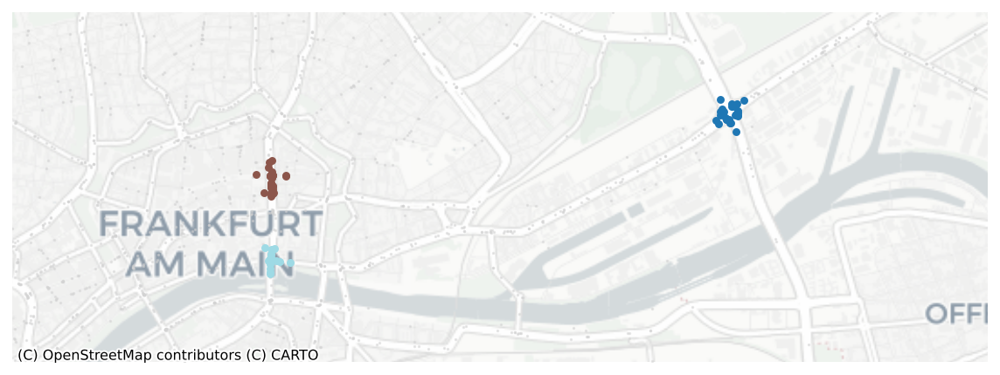

In [149]:
from sklearn.cluster import DBSCAN

Frankfurt_Night = Frankfurt[Frankfurt['ULICHTVERH'] == 2].copy()

# Parameters for tuning
current_eps = 100
current_min_samples = 27

# Call and fit DBSCAN
clusterer = DBSCAN(
    metric='euclidean', 
    eps=current_eps,
    min_samples=current_min_samples
)
# --- MODIFIED: Use the Rad ---
clusterer.fit(Frankfurt_Night[["LINREFX", "LINREFY"]])

# Ger labels and assign
lbls = clusterer.labels_
# --- MODIFIED: Use the Rad ---
Frankfurt_Night.loc[:, 'labels'] = lbls

# Print findings
unique_labels = np.unique(lbls)
num_clusters = len(unique_labels[unique_labels != -1])
print(f"--- Run Complete for 'IstRad == 1' ---") # Added detail
print(f"Eps: {current_eps}, Min Samples: {current_min_samples}")
print(f"Found {num_clusters} clusters")
print("----------------------")

# Geodataframe
gdf = gpd.GeoDataFrame(
    Frankfurt_Night, 
    geometry=gpd.points_from_xy(Frankfurt_Night.XGCSWGS84, Frankfurt_Night.YGCSWGS84),
    crs="EPSG:4326"
)
gdf_wm = gdf.to_crs(epsg=3857)

# Plot results
fig, ax = plt.subplots(figsize=(10, 10), dpi=144)

# Plot noise
noise_wm = gdf_wm[gdf_wm['labels'] == -1]
noise_wm.plot(ax=ax, color='lightgrey', markersize=0.5, alpha=0.5, label='Noise')

# Get all unique cluster IDs (all non noise clusters)
cluster_ids = unique_labels[unique_labels != -1]

# Colors
colors = plt.cm.get_cmap('tab20', len(cluster_ids))

# Plot each cluster individually
for i, cluster_id in enumerate(cluster_ids):
    cluster_Rad = gdf_wm[gdf_wm['labels'] == cluster_id]
    cluster_Rad.plot(
        ax=ax,
        color=colors(i),
        markersize=12,
        label=f'Cluster {cluster_id}'
    )

clusters_wm = gdf_wm[gdf_wm['labels'] != -1]

# Check if any clusters were actually found
if not clusters_wm.empty:
    # Get the total bounding box of all clusters
    minx, miny, maxx, maxy = clusters_wm.total_bounds
    
    # Add some padding
    padding_x = (maxx - minx) * 0.5
    padding_y = (maxy - miny) * 0.5
    
    ax.set_xlim(minx - padding_x, maxx + padding_x)
    ax.set_ylim(miny - padding_y, maxy + padding_y)

# Add basemap
contextily.add_basemap(
    ax,
    source=contextily.providers.CartoDB.Positron,
    zoom='auto',
    interpolation='bilinear'
)
ax.set_axis_off()

# Filter out noise points (label == -1)
clusters_df = Frankfurt_Night[Frankfurt_Night['labels'] != -1]

# Check if any clusters were found
if clusters_df.empty:
    print("No clusters found (only noise).")
else:
    # Group by cluster label and get the mean of the Lat/Lon columns
    cluster_centers = clusters_df.groupby('labels')[['YGCSWGS84', 'XGCSWGS84']].mean()
    
    # Rename columns for clarity
    cluster_centers = cluster_centers.rename(columns={
        'YGCSWGS84': 'Latitude',
        'XGCSWGS84': 'Longitude'
    })
    
    # Create Google Maps link
    def create_gmaps_link(row):
        return f"https://www.google.com/maps/search/?api=1&query={row['Latitude']},{row['Longitude']}"
    
    cluster_centers['Google_Maps_Link'] = cluster_centers.apply(create_gmaps_link, axis=1)
    
    # Print the results
    pd.set_option('display.max_colwidth', None)
    print("--- Cluster Center Coordinates ---")
    print(cluster_centers)

In [150]:
print("\n--- Breakdown of Accident Category (UTYP1) by Cluster ---")
print(clusters_df.groupby('labels')['UTYP1'].value_counts())



--- Breakdown of Accident Category (UTYP1) by Cluster ---
labels  UTYP1                                                   
0       Accident between vehicles moving along in carriageway       22
        Accident caused by turning into a road or by crossing it    10
        Accident caused by turning off the road                      1
        Other accident                                               1
1       Accident caused by crossing the road                        12
        Accident caused by turning into a road or by crossing it     7
        Accident between vehicles moving along in carriageway        5
        Other accident                                               5
        Accident caused by turning off the road                      3
        Driving accident                                             2
        Accident involving stationary                                1
2       Accident between vehicles moving along in carriageway       11
        Accident caused 